In [1]:
%%HTML
<style> code {background-color : pink !important;} </style>

Camera Calibration with OpenCV
===

### Run the code in the cell below to extract object points and image points for camera calibration.  

In [2]:
import numpy as np
import os
import cv2
import glob
import pickle
from scipy import signal
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib qt

# setup
scale = 720/1280 # 1/5.1111
nx = 8 # the number of inside corners in x
ny = 6 # the number of inside corners in y
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('calibration_wide/GO*.jpg')
#images = glob.glob('gopro720m/GO*.JPG')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    rows,cols,chs = img.shape
    img = cv2.resize(img,(int(cols*scale),int(rows*scale)))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        #write_name = 'corners_found'+str(idx)+'.jpg'
        #cv2.imwrite(write_name, img)
        cv2.imshow('img', img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

### If the above cell ran sucessfully, you should now have `objpoints` and `imgpoints` needed for camera calibration.  Run the cell below to calibrate, calculate distortion coefficients, and test undistortion on an image!

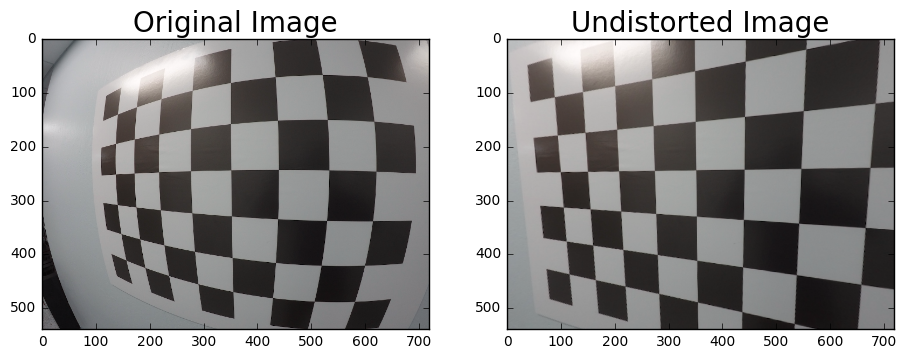

In [3]:
import pickle
%matplotlib inline

# Test undistortion on an image
img = cv2.imread('calibration_wide/GOPR0036.jpg')
img = cv2.resize(img,(int(cols*scale),int(rows*scale)))
img_size = (img.shape[1], img.shape[0])
#cv2.imwrite('gopro720m/GOPR7216s.JPG',img)

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)


dst = cv2.undistort(img, mtx, dist, None, mtx)
#cv2.imwrite('gopro720m/GOPR7216u.JPG',dst)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "output_images/720x540_pickle.p", "wb" ) )
#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11,5))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=20)

In [4]:
# Define a function that takes an image, number of x and y points, 
# camera matrix and distortion coefficients
def corners_unwarp(img, nx, ny, mtx, dist):
    # Use the OpenCV undistort() function to remove distortion
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # Convert undistorted image to grayscale
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    # Search for corners in the grayscaled image
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    if ret == True:
        # If we found corners, draw them! (just for fun)
        cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
        # Choose offset from image corners to plot detected corners
        # This should be chosen to present the result at the proper aspect ratio
        # My choice of 100 pixels is not exact, but close enough for our purpose here
        offset = 75 # offset for dst points
        # Grab the image shape
        img_size = (gray.shape[1], gray.shape[0])

        # For source points I'm grabbing the outer four detected corners
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        # For destination points, I'm arbitrarily choosing some points to be
        # a nice fit for displaying our warped result 
        # again, not exact, but close enough for our purposes
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
        # Given src and dst points, calculate the perspective transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
        # Warp the image using OpenCV warpPerspective()
        warped = cv2.warpPerspective(undist, M, img_size)

    # Return the resulting image and matrix
    return warped, M

540 720


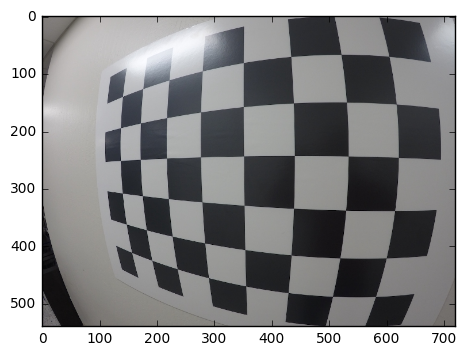

In [5]:
# Read in the saved camera matrix and distortion coefficients
# These are the arrays you calculated using cv2.calibrateCamera()
dist_pickle = pickle.load( open( "output_images/720x540_pickle.p", "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]
#scale = 1/5.1111
# Read in an image
img = cv2.imread('calibration_wide/GOPR0036.jpg')
rows, cols, chs = img.shape
#print(rows, cols)
img = cv2.resize(img,(int(cols*scale),int(rows*scale)))
rows, cols, chs = img.shape
print(rows, cols)
#nx = 9 # the number of inside corners in x
#ny = 6 # the number of inside corners in y
dst = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(dst)

In [6]:
top_down, perspective_M = corners_unwarp(img, nx, ny, mtx, dist)

#plot the two images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(top_down)
ax2.set_title('Undistorted and Warped Image', fontsize=20)
plt.subplots_adjust(left=0, right=1, top=0.9, bottom=0.)


UnboundLocalError: local variable 'warped' referenced before assignment

In [7]:
# Define a function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0,255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return binary_output

In [8]:
# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

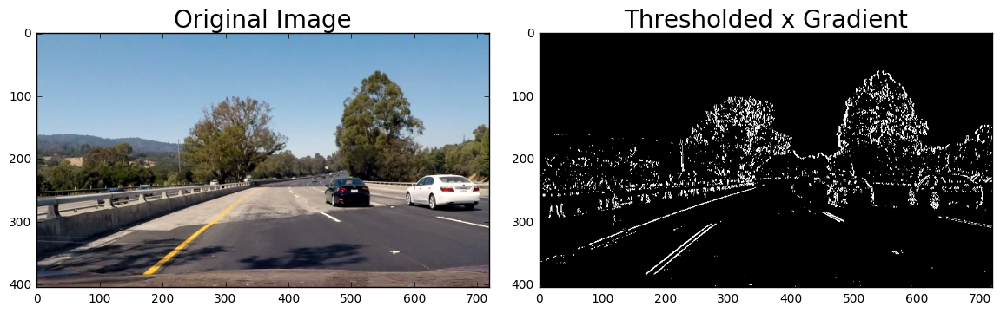

In [9]:
# Read in an image
image = mpimg.imread('test_images/test4.jpg')
image = cv2.resize(image,(720,405))
# Run the function
grad_binary = abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(30, 130))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded x Gradient', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

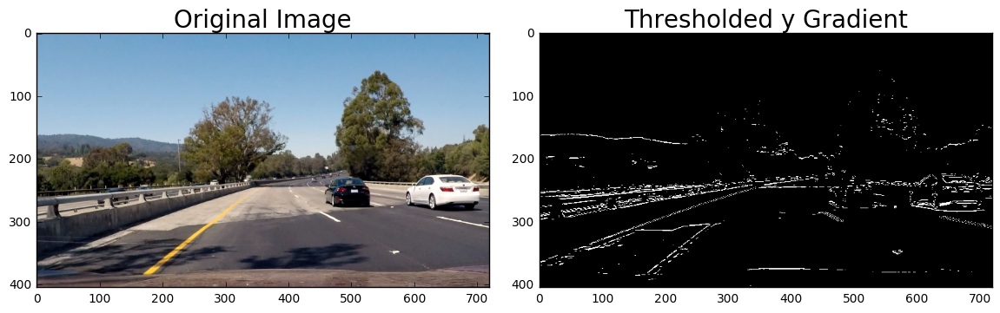

In [10]:
# Read in an image
image = mpimg.imread('test_images/test4.jpg')
image = cv2.resize(image,(720,405))
# Run the function
grad_binary = abs_sobel_thresh(image, orient='y',sobel_kernel=3, thresh=(70, 130))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded y Gradient', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

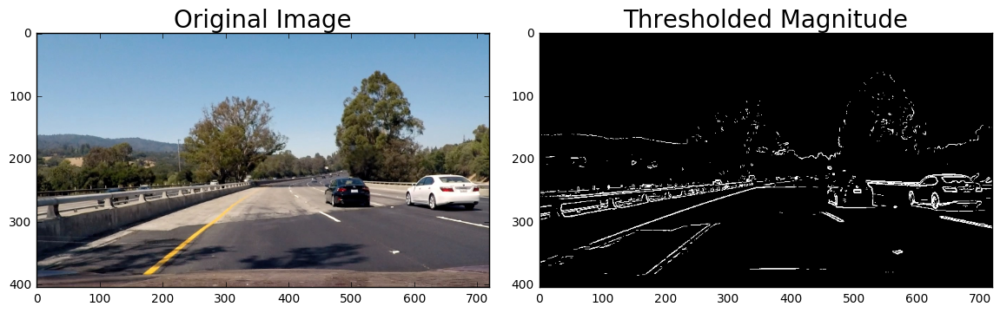

In [11]:
# Read in an image
image = mpimg.imread('test_images/test4.jpg')
image = cv2.resize(image,(720,405))
    
# Run the function
mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(80, 255))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [12]:
# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

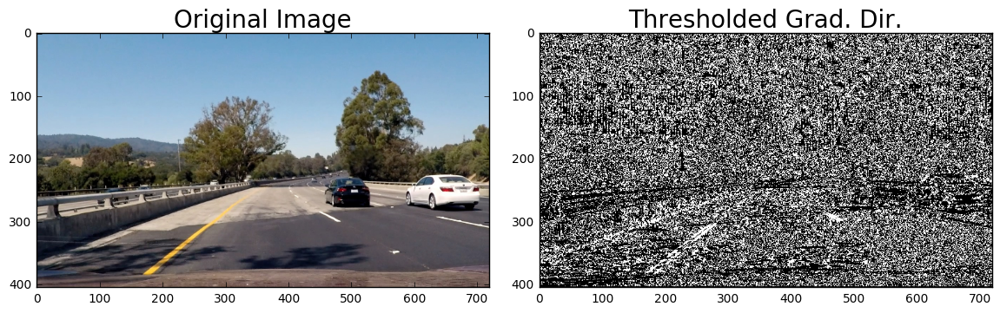

In [13]:
# Read in an image
image = mpimg.imread('test_images/test4.jpg')
image = cv2.resize(image,(720,405))
    
# Run the function
dir_binary = dir_threshold(image, sobel_kernel=3, thresh=(0.7, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

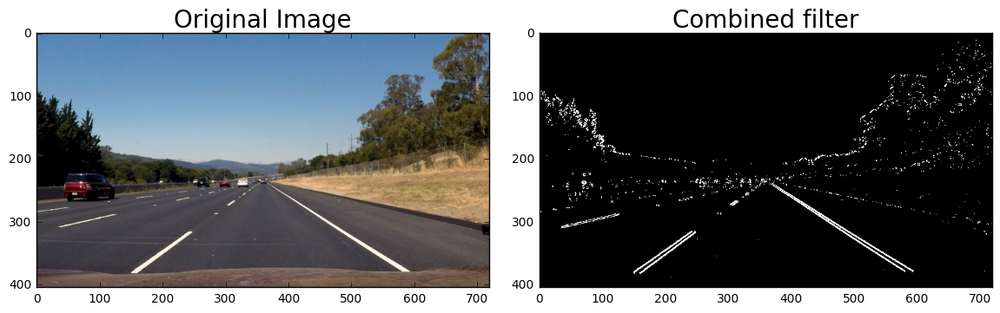

In [14]:
# Read in an image
image = mpimg.imread('test_images/straight_lines2.jpg')
image = cv2.resize(image,(720,405))


# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(30, 230))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=3, thresh=(30, 230))
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(80, 150))
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3))
combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Combined filter', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [15]:
# Make a list of test images
#images = glob.glob('calibration_wide/GO*.jpg')
test_images = glob.glob('test_images/*.jpg')
print(test_images)

['test_images/test5.jpg', 'test_images/test3.jpg', 'test_images/straight_lines1.jpg', 'test_images/test2.jpg', 'test_images/test4.jpg', 'test_images/test6.jpg', 'test_images/test1.jpg', 'test_images/straight_lines2.jpg']


In [16]:
# Define a function that thresholds the S-channel of HLS
def hls_select(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

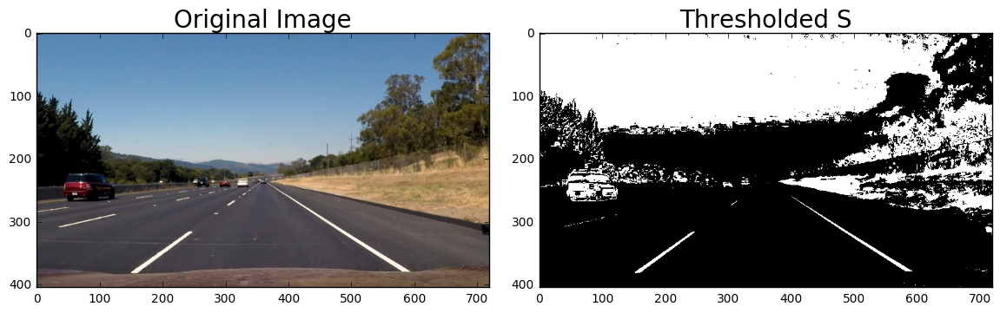

In [17]:
# Read in an image
image = mpimg.imread('test_images/straight_lines2.jpg')
image = cv2.resize(image,(720,405))


hls_binary = hls_select(image, thresh=(90, 255))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(hls_binary, cmap='gray')
ax2.set_title('Thresholded S', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [18]:
for idx, fname in enumerate(test_images):
    image = cv2.imread(fname)
    image = cv2.resize(image,(720,405))
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(30, 230))
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=3, thresh=(30, 230))
    mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(80, 150))
    dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3))
    hls_binary = hls_select(image, thresh=(90, 255))
    combined = np.zeros_like(dir_binary)
    
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    #combined[((grady == 1) & (hls_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    if ret == True:

        # Draw and display the corners
        #cv2.drawChessboardCorners(image, (nx,ny), corners, ret)
        #write_name = 'corners_found'+str(idx)+'.jpg'
        #cv2.imwrite(write_name, img)
        cv2.imshow('combined filter image', combined)
        #plt.imshow(hls_binary, cmap='gray')
        cv2.waitKey(2500)
    
cv2.destroyAllWindows()

In [44]:
def perspective_transform(img, M):
    warped = cv2.warpPerspective(img, M, dsize = (img.shape[1],img.shape[0]), flags = cv2.INTER_LINEAR)
    return warped


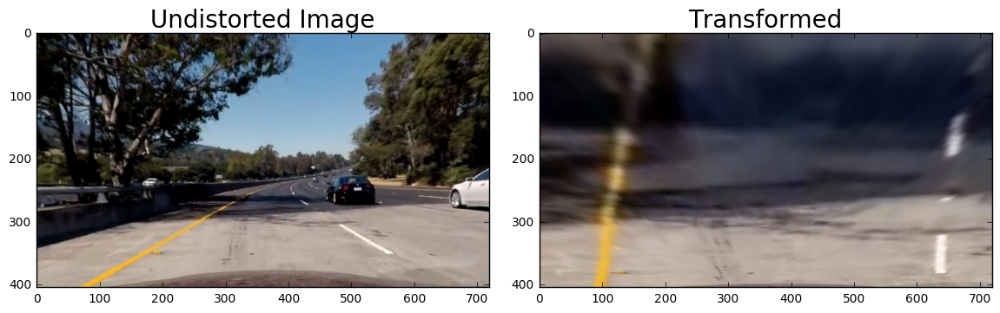

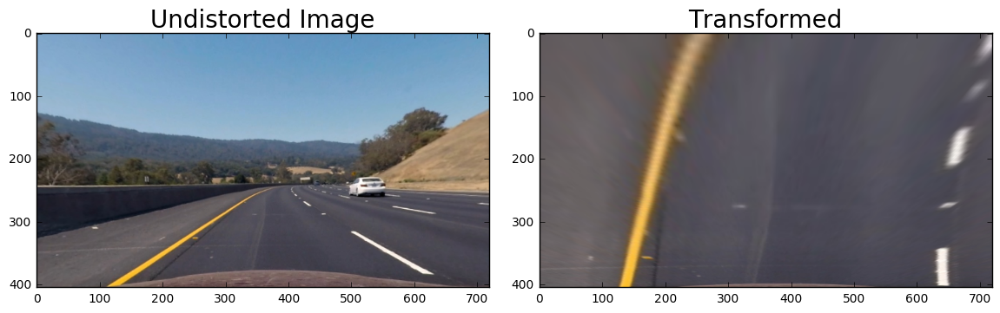

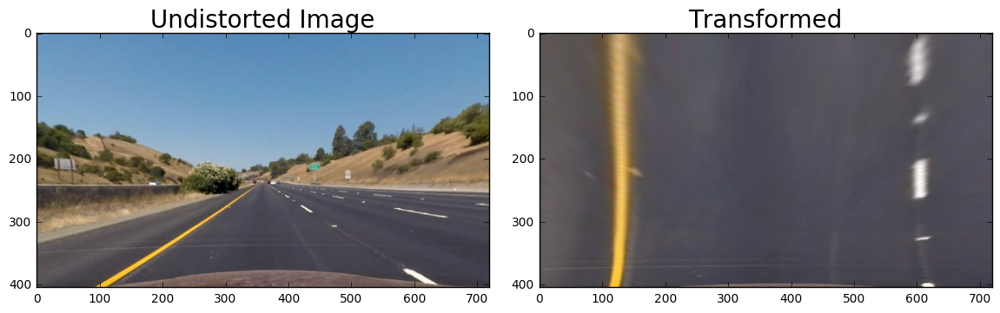

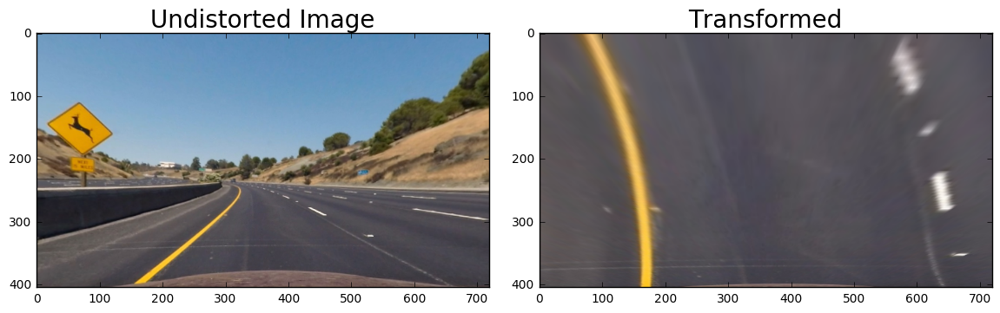

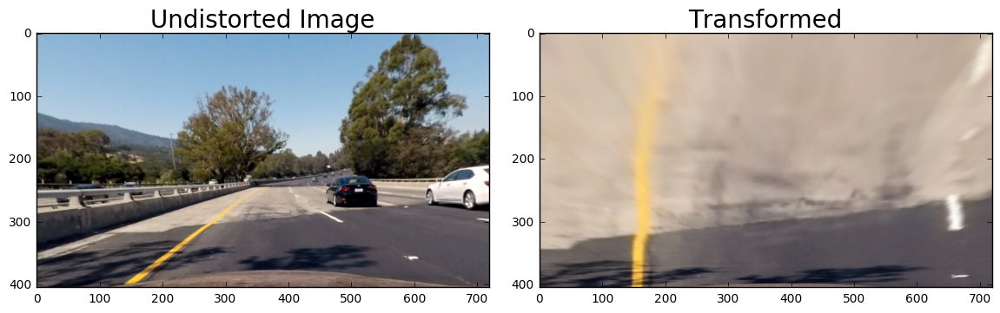

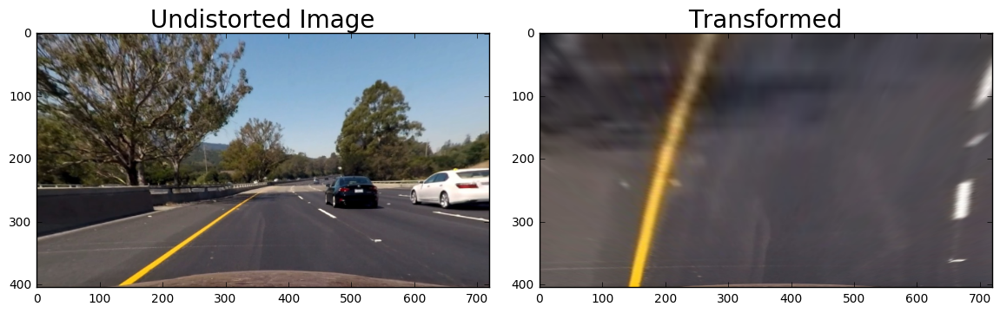

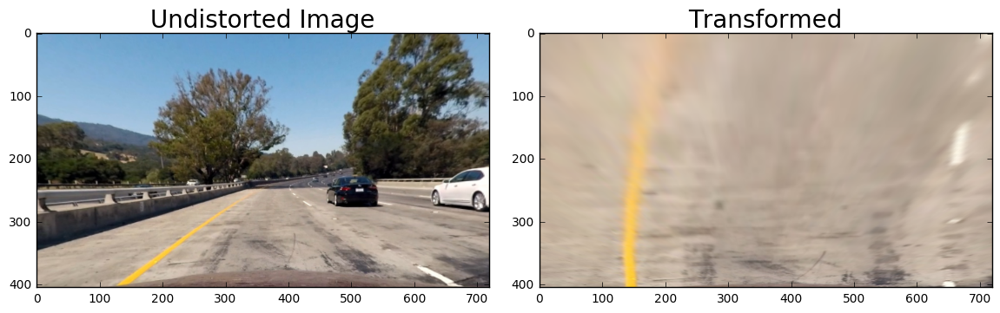

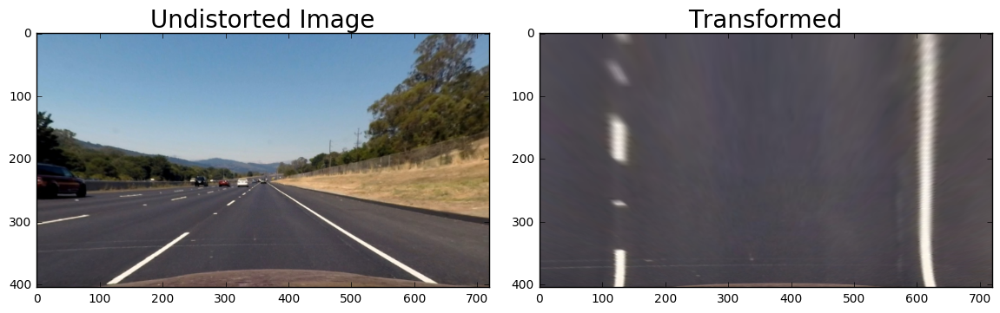

In [21]:
import os

def perspective_transform(img, M):
    warped = cv2.warpPerspective(img, M, dsize = (img.shape[1],img.shape[0]), flags = cv2.INTER_LINEAR)
    return warped

#src = np.float32([[334,258],[439,258],[60,405],[720,405]])
#src = np.float32([[330,258],[439,258],[60,405],[700,405]])
apex, apey = 360, 258
offset_far = 50
offset_near = 10
src = np.float32([[int(apex-offset_far),apey],
                  [int(apex+offset_far),apey],
                  [int(0+offset_near),390],
                  [int(720-offset_near),390]])
dst = np.float32([[0,0],[720,0],[0,405],[720,405]])
M = cv2.getPerspectiveTransform(src, dst)

images = os.listdir('./test_images')  
for fname in images:
    fname = os.path.join('test_images',fname)
    img = mpimg.imread(fname)
    img = cv2.resize(img, (720, 405))
    img = cv2.undistort(img, mtx, dist, None, mtx)
    warped = perspective_transform(img, M)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Undistorted Image', fontsize=20)
    ax2.imshow(warped)
    ax2.set_title('Transformed', fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

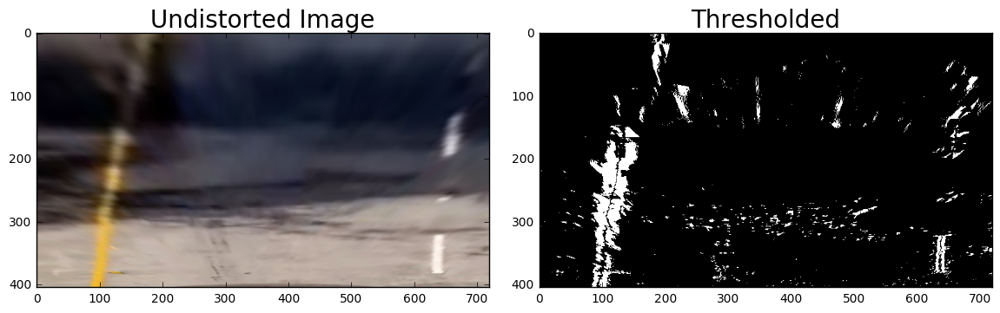

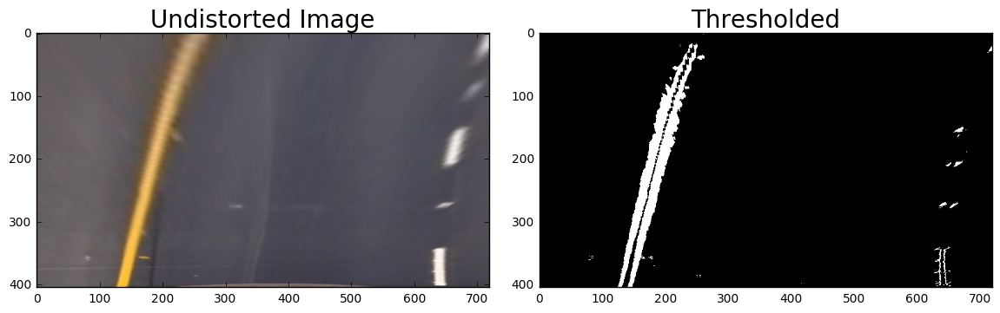

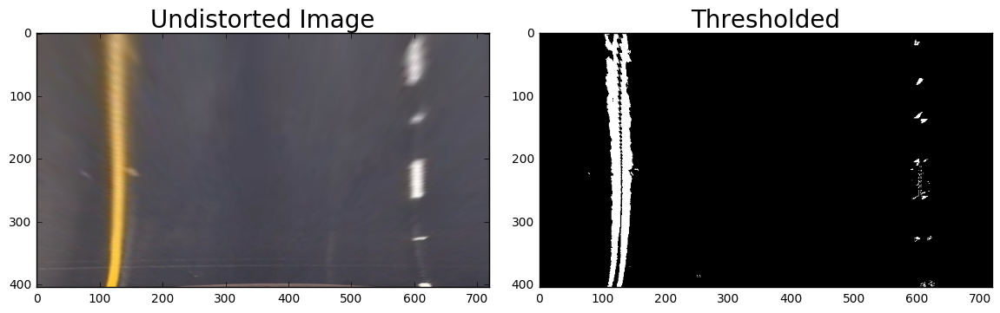

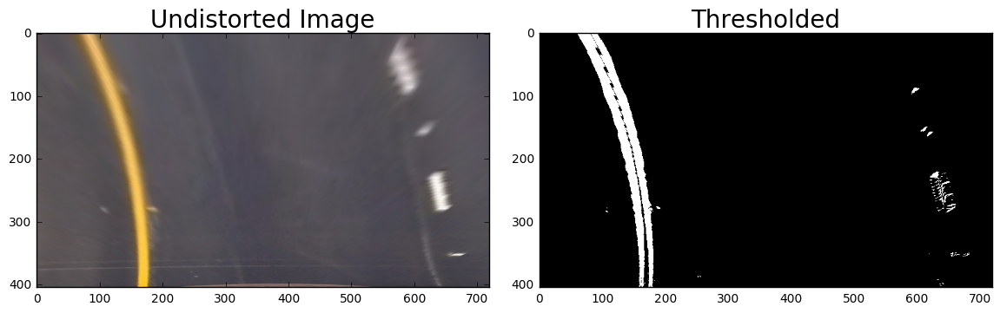

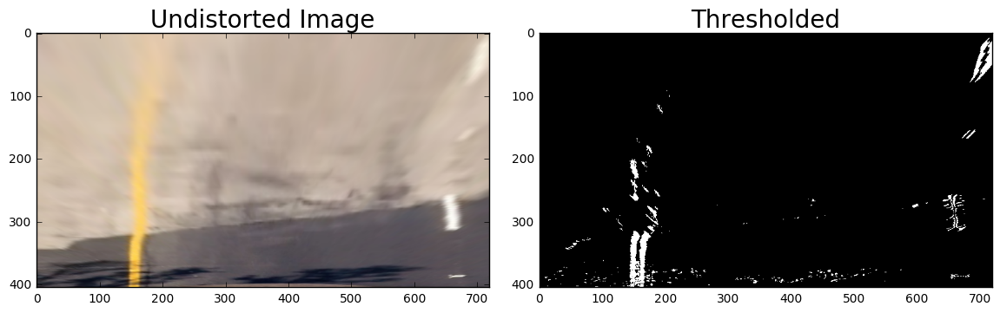

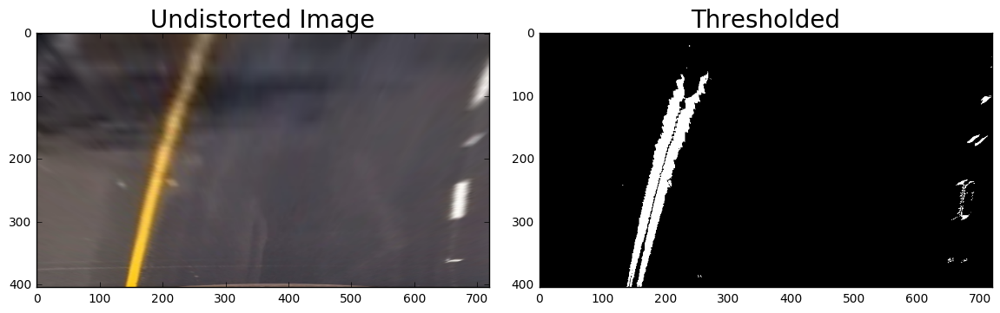

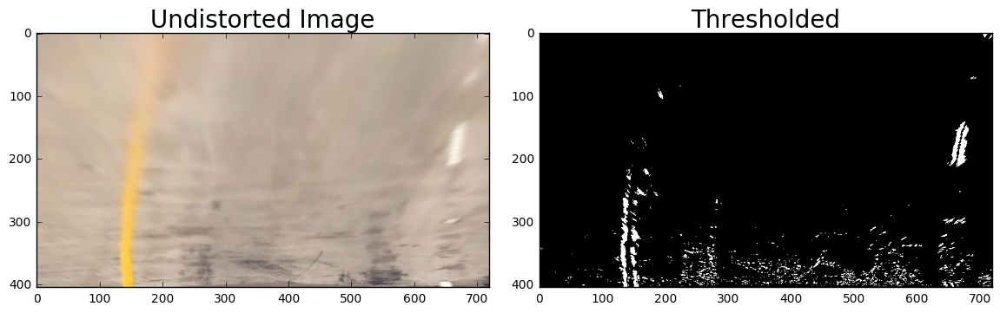

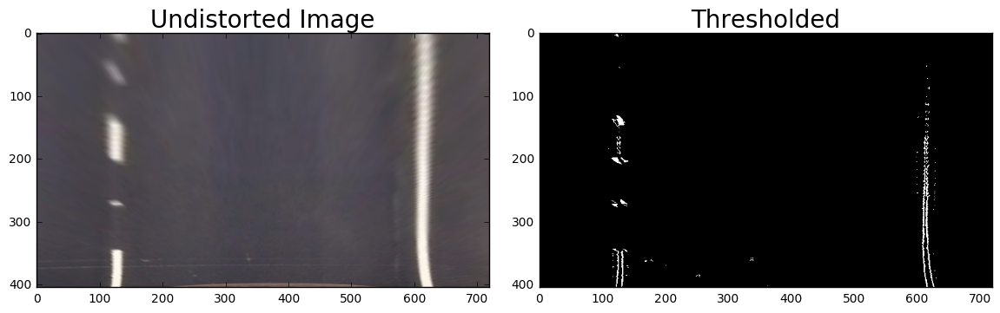

In [23]:
for fname in images:
    fname = os.path.join('test_images',fname)
    img = mpimg.imread(fname)
    img = cv2.resize(img, (720, 405))
    img = cv2.undistort(img, mtx, dist, None, mtx)
    warped = perspective_transform(img, M)
    gray = cv2.cvtColor(warped, cv2.COLOR_BGR2GRAY)
    gradx = abs_sobel_thresh(warped, orient='x', sobel_kernel=3, thresh=(10, 230))
    grady = abs_sobel_thresh(warped, orient='y', sobel_kernel=3, thresh=(10, 230))
    mag_binary = mag_thresh(warped, sobel_kernel=ksize, mag_thresh=(30, 150))
    dir_binary = dir_threshold(warped, sobel_kernel=ksize, thresh=(0.7, 1.3))
    hls_binary = hls_select(warped, thresh=(80, 255))
    combined = np.zeros_like(dir_binary)
    
    combined[((gradx == 1) & (hls_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
    f.tight_layout()
    ax1.imshow(warped)
    ax1.set_title('Undistorted Image', fontsize=20)
    ax2.imshow(combined,cmap='gray' )
    ax2.set_title('Thresholded', fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

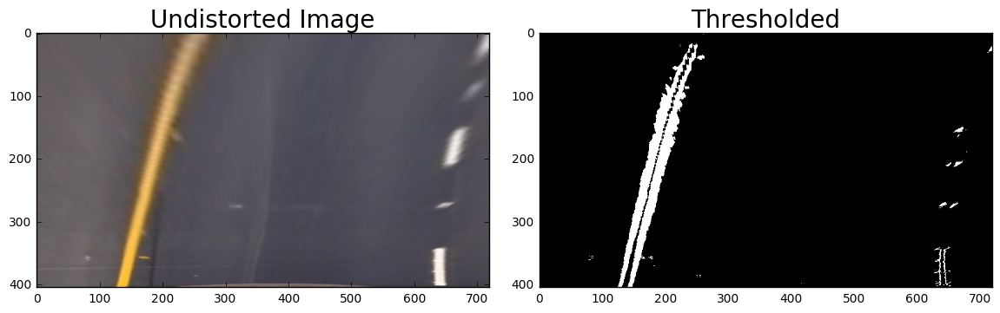

In [24]:
# Read in an image
image = mpimg.imread('test_images/test3.jpg')
image = cv2.resize(image,(720,405))

img = cv2.undistort(image, mtx, dist, None, mtx)
warped = perspective_transform(img, M)
gray = cv2.cvtColor(warped, cv2.COLOR_BGR2GRAY)
gradx = abs_sobel_thresh(warped, orient='x', sobel_kernel=3, thresh=(10, 230))
grady = abs_sobel_thresh(warped, orient='y', sobel_kernel=3, thresh=(10, 230))
mag_binary = mag_thresh(warped, sobel_kernel=ksize, mag_thresh=(30, 150))
dir_binary = dir_threshold(warped, sobel_kernel=ksize, thresh=(0.7, 1.3))
hls_binary = hls_select(warped, thresh=(80, 255))
combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (hls_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
f.tight_layout()
ax1.imshow(warped)
ax1.set_title('Undistorted Image', fontsize=20)
ax2.imshow(combined,cmap='gray' )
ax2.set_title('Thresholded', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


In [25]:
#from scipy import signal

def histogram(img):
    left_x = []
    left_y = []
    right_x = []
    right_y = []
    layers = 8
    lane_center = 130
    lane_dist = -400
    pointer = int(img.shape[0]/layers)
    
    for bottom in range(layers):
        end = int(img.shape[0]/layers) 
        # produce histogram for each layer 
        #histogram = np.sum(img[pointer:pointer+end,:], axis=0)
        histogram_left = np.sum(img[pointer:pointer+end,0:int(img.shape[1]/2)], axis=0)
        histogram_right = np.sum(img[pointer:pointer+end,int(img.shape[1]/2):img.shape[1]], axis=0)
        # find the peaks in the histogram                            
        #peakind = signal.find_peaks_cwt(histogram, np.arange(1, 15))
        peak_left = np.mean(signal.find_peaks_cwt(histogram_left, np.arange(1, 15)))
        peak_right = np.mean(signal.find_peaks_cwt(histogram_right, np.arange(1, 15)))
        """                    
        if(len(peakind) > 0):
            for num in peakind:
                if num < img.shape[1]/2-lane_center:
                    if num > 80:
                        left_y.append(num)
                        left_x.append(pointer)
                if num > img.shape[1]/2+lane_center:
                    if num < 680:
                        right_y.append(num)
                        right_x.append(pointer)
        """
        if 70 < peak_left < img.shape[1]/2-lane_center:
            left_y.append(peak_left)
            left_x.append(pointer)
            
        if img.shape[1]/2+lane_center< peak_right+int(img.shape[1]/2) < 690:
            right_y.append(peak_right+int(img.shape[1]/2))
            right_x.append(pointer)
                
        pointer = pointer + int(img.shape[0]/layers)
    """
    # clean some data point far from the center    
    for i in range (len(left_x)):
        if(left_x[i]-np.mean(right_x))<lane_dist:
            left_x.pop(i)
            left_y.pop(i)
    # clean some data that far from the center        
    for i in range (len(right_x)):
        if(np.mean(left_x)-right_x[i])<lane_dist:
            right_x.pop(i)
            right_y.pop(i)
    """                        
    return left_y, left_x, right_y, right_x


In [26]:
def polyfit(img, y_eval=200):
    hist = histogram(img)

    lefty = hist[1]
    leftx = hist[0]
    righty = hist[3]
    rightx = hist[2]
    yvals = np.linspace(0, img.shape[0], num=img.shape[0])

    # Fit a second order polynomial to each fake lane line
    left_fit = np.polyfit(lefty, leftx, 2)
    left_fitx = left_fit[0]*yvals**2 + left_fit[1]*yvals + left_fit[2]
    right_fit = np.polyfit(righty, rightx, 2)
    right_fitx = right_fit[0]*yvals**2 + right_fit[1]*yvals + right_fit[2]

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/405 # meters per pixel in y dimension
    xm_per_pix = 3.7/600 # meteres per pixel in x dimension
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    #y_eval = np.max(yvals)

    left_fit_cr = np.polyfit(np.array(lefty,dtype=np.float32)*ym_per_pix, \
                         np.array(leftx,dtype=np.float32)*xm_per_pix, 2)
    right_fit_cr = np.polyfit(np.array(righty,dtype=np.float32)*ym_per_pix, \
                          np.array(rightx,dtype=np.float32)*xm_per_pix, 2)
    # Return radius of curvature is in meters
    return left_curverad(left_fit_cr, y_eval), right_curverad(right_fit_cr, y_eval)

def left_curverad(left_fit_cr, y_eval):
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval + left_fit_cr[1])**2)**1.5) \
                             /np.absolute(2*left_fit_cr[0])
    return left_curverad

def right_curverad(right_fit_cr, y_eval):
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval + right_fit_cr[1])**2)**1.5) \
                                /np.absolute(2*right_fit_cr[0])
    return right_curverad


In [31]:
def pipeline(img,mtx,dist,M, Mi):
    img = cv2.resize(img, (720, 405))
    img = cv2.undistort(img, mtx, dist, None, mtx)
    warped = perspective_transform(img, M)
    gray = cv2.cvtColor(warped, cv2.COLOR_BGR2GRAY)
    gradx = abs_sobel_thresh(warped, orient='x', sobel_kernel=3, thresh=(10, 230))
    grady = abs_sobel_thresh(warped, orient='y', sobel_kernel=3, thresh=(10, 230))
    mag_binary = mag_thresh(warped, sobel_kernel=ksize, mag_thresh=(30, 150))
    dir_binary = dir_threshold(warped, sobel_kernel=ksize, thresh=(0.7, 1.3))
    hls_binary = hls_select(warped, thresh=(80, 255))
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (hls_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    leftx, lefty, rightx, righty = histogram(combined)
    
    #lefty = hist[1]
    #leftx = hist[0]
    #righty = hist[3]
    #rightx = hist[2]
    yvals = np.linspace(0, img.shape[0], num=img.shape[0])

    # Fit a second order polynomial to each fake lane line
    left_fit = np.polyfit(lefty, leftx, 2)
    left_fitx = left_fit[0]*yvals**2 + left_fit[1]*yvals + left_fit[2]
    right_fit = np.polyfit(righty, rightx, 2)
    right_fitx = right_fit[0]*yvals**2 + right_fit[1]*yvals + right_fit[2]

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/405 # meters per pixel in y dimension
    xm_per_pix = 3.7/600 # meteres per pixel in x dimension
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(yvals)

    left_fit_cr = np.polyfit(np.array(lefty,dtype=np.float32)*ym_per_pix, \
                         np.array(leftx,dtype=np.float32)*xm_per_pix, 2)
    right_fit_cr = np.polyfit(np.array(righty,dtype=np.float32)*ym_per_pix, \
                          np.array(rightx,dtype=np.float32)*xm_per_pix, 2)
    
    # Return radius of curvature is in meters
    
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval + left_fit_cr[1])**2)**1.5) \
                             /np.absolute(2*left_fit_cr[0])

    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval + right_fit_cr[1])**2)**1.5) \
                                /np.absolute(2*right_fit_cr[0])
    
    # Find camera position
    left_mean = np.mean(leftx)
    right_mean = np.mean(rightx)
    camera_pos = (combined.shape[1]/2)-np.mean([left_mean, right_mean])
    # Link all points for cv2.fillPoly() in pix space
    pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
    pts = np.hstack((pts_left, pts_right))
    pts = np.array([pts], dtype=np.int32)
    # Draw the lane onto the warped blank image
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    cv2.fillPoly(warp_zero, pts, (0,255, 0))
    cv2.polylines(warp_zero, np.array([pts_left], dtype=np.int32), False,(255,0,0),thickness = 20)
    cv2.polylines(warp_zero, np.array([pts_right], dtype=np.int32), False,(0,0,255),thickness = 20)
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(img,'left curve' + ' ' + str(left_curverad) + ' m',(10,100), font, 1,(255,255,255),1,cv2.LINE_AA)
    cv2.putText(img,'right curve' + ' ' + str(right_curverad) + ' m',(10,150), font, 1,(255,255,255),1,cv2.LINE_AA)
    cv2.putText(img,'Vehicle Position' + ' ' + str(camera_pos*xm_per_pix) + ' m',(10,50), font, 1,(255,255,255),1,cv2.LINE_AA)
    # Warp back to original view
    unwarp = perspective_transform(warp_zero, Mi)
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, unwarp, 0.5, 0)
    #result = cv2.resize(result, (720, 405))

    return result

    

/home/tsuu/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/numpy/core/_methods.py:59: RuntimeWarning: Mean of empty slice.
  warnings.warn("Mean of empty slice.", RuntimeWarning)
/home/tsuu/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/numpy/core/_methods.py:70: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/tsuu/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/scipy/signal/_peak_finding.py:412: RuntimeWarning: divide by zero encountered in double_scalars
  snr = abs(cwt[line[0][0], line[1][0]] / noises[line[1][0]])


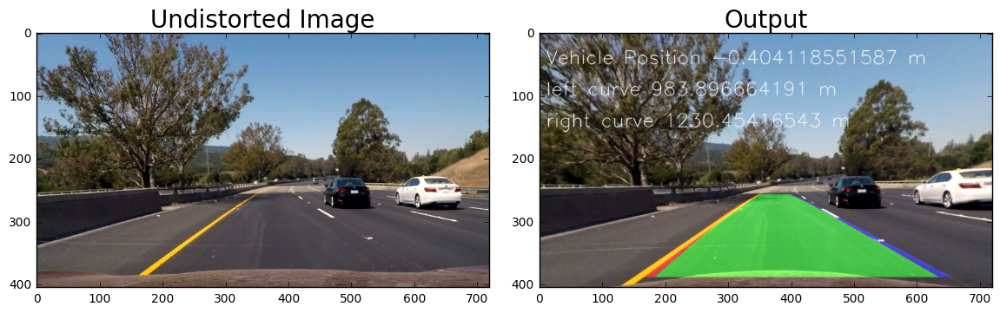

In [43]:
# Read in an image
image = mpimg.imread('test_images/test6.jpg')
image = cv2.resize(image,(720,405))

apex, apey = 360, 258
offset_far = 48
offset_near = 2
src = np.float32([[int(apex-offset_far),apey],
                  [int(apex+offset_far),apey],
                  [int(0+offset_near),390],
                  [int(720-offset_near),390]])
dst = np.float32([[0,0],[720,0],[0,405],[720,405]])
M = cv2.getPerspectiveTransform(src, dst)
Mi = cv2.getPerspectiveTransform(dst, src)

result = pipeline(image, mtx,dist,M, Mi)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Undistorted Image', fontsize=20)
ax2.imshow(result,cmap='gray' )
ax2.set_title('Output', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


In [33]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

#leftLine = Line()
#rightLine = Line()

write_output = 'project_video_out.mp4'
clip1 = VideoFileClip("project_video.mp4")
write_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time write_clip.write_videofile(write_output, audio=False)



NeedDownloadError: Need ffmpeg exe. You can download it by calling:
  imageio.plugins.ffmpeg.download()